In [21]:


#     Final Project ML Part 2: Face Mask Detection 
#     Authors:
#     Amitabh Rajkumar Saini, amitabhr@usc.edu
#     Shilpa Jain, shilpaj@usc.edu
#     Sushumna Khandelwal, sushumna@usc.edu
    
#     Output:
#     Real Time Face Mask Detection Model 



In [4]:
# import the necessary packages
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import AveragePooling2D, MaxPool2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import os
from IPython.display import display
import PIL

In [5]:
# initialize the initial learning rate, number of epochs to train for,
# and batch size
INIT_LR = 1e-4
EPOCHS = 20
BS = 32

In [6]:
import sys
from PIL import Image
sys.modules['Image'] = Image 
from PIL import Image
print(Image.__file__)
import Image
print(Image.__file__)

/Users/shilpajain/anaconda3/envs/CV/lib/python3.7/site-packages/PIL/Image.py
/Users/shilpajain/anaconda3/envs/CV/lib/python3.7/site-packages/PIL/Image.py


In [7]:
# grab the list of images in our dataset directory, then initialize
# the list of data (i.e., images) and class images
print("[INFO] loading images...")
imagePaths = list(paths.list_images("./dataset/"))
data = []
labels = []
# loop over the image paths
for imagePath in imagePaths:
	# extract the class label from the filename
	label = imagePath.split(os.path.sep)[-2]
	# load the input image (224x224) and preprocess it
	image = load_img(imagePath, target_size=(224, 224))
	image = img_to_array(image)
	image = preprocess_input(image)
	# update the data and labels lists, respectively
	data.append(image)
	labels.append(label)
# convert the data and labels to NumPy arrays
data = np.array(data, dtype="float32")
labels = np.array(labels)

[INFO] loading images...


In [8]:
# perform one-hot encoding on the labels
lb = LabelBinarizer()
labels = lb.fit_transform(labels)
labels = to_categorical(labels)
# partition the data into training and testing splits using 80% of the data for training and the remaining 20% for testing
(trainX, testX, trainY, testY) = train_test_split(data, labels,
	test_size=0.30, stratify=labels, random_state=42)
# construct the training image generator for data augmentation
aug = ImageDataGenerator(
	rotation_range=20,
	zoom_range=0.15,
	width_shift_range=0.2,
	height_shift_range=0.2,
	shear_range=0.15,
	horizontal_flip=True,
	fill_mode="nearest")

CNN_MobileNetV2

In [9]:
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import Conv2D

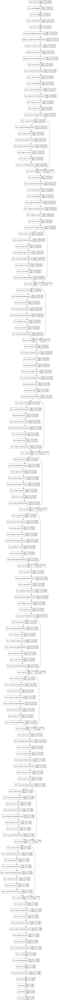

In [10]:
# load the MobileNetV2 network, ensuring the head FC layer sets are left off
baseModel_mobile = MobileNetV2(weights="imagenet", include_top=False,
	input_tensor=Input(shape=(224, 224, 3)))
# construct the head of the model that will be placed on top of the base model
headModel_mobile = baseModel_mobile.output
headModel_mobile = AveragePooling2D(pool_size=(7, 7))(headModel_mobile)
headModel_mobile = Flatten(name="flatten")(headModel_mobile)
headModel_mobile = Dense(128, activation="relu")(headModel_mobile)
headModel_mobile = Dropout(0.5)(headModel_mobile)
headModel_mobile = Dense(2, activation="softmax")(headModel_mobile)
# place the head FC model on top of the base model (this will become the actual model we will train)
model_mobile = Model(inputs=baseModel_mobile.input, outputs=headModel_mobile)
# loop over all layers in the base model and freeze them so they will *not* be updated during the first training process
for layer in baseModel_mobile.layers:
	layer.trainable = False
dot_img_file = './model_mobilenet.png'
plot_model(model_mobile, to_file=dot_img_file, show_shapes=True)

ResNet

In [74]:
from tensorflow.keras.applications import ResNet50V2

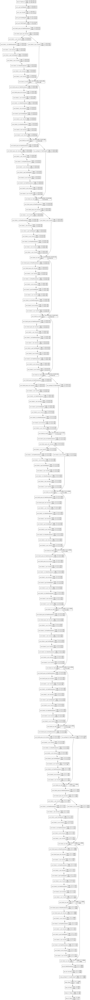

In [75]:
# load the ResNet50V2 network, ensuring the head FC layer sets are left off
baseModel_resnet = ResNet50V2(weights="imagenet", include_top=False,
	input_tensor=Input(shape=(224, 224, 3)))
# construct the head of the model that will be placed on top of the base model
headModel_resnet = baseModel_resnet.output
headModel_resnet = AveragePooling2D(pool_size=(7, 7))(headModel_resnet)
headModel_resnet = Flatten(name="flatten")(headModel_resnet)
headModel_resnet = Dense(128, activation="relu")(headModel_resnet)
headModel_resnet = Dropout(0.5)(headModel_resnet)
headModel_resnet = Dense(2, activation="softmax")(headModel_resnet)
# place the head FC model on top of the base model (this will become the actual model we will train)
model_resnet = Model(inputs=baseModel_resnet.input, outputs=headModel_resnet)
# loop over all layers in the base model and freeze them so they will *not* be updated during the first training process
for layer in baseModel_resnet.layers:
	layer.trainable = False
dot_img_file = '/tmp/model_resnet.png'
plot_model(model_resnet, to_file=dot_img_file, show_shapes=True)

Inception Model

In [76]:
from tensorflow.keras.applications import VGG19

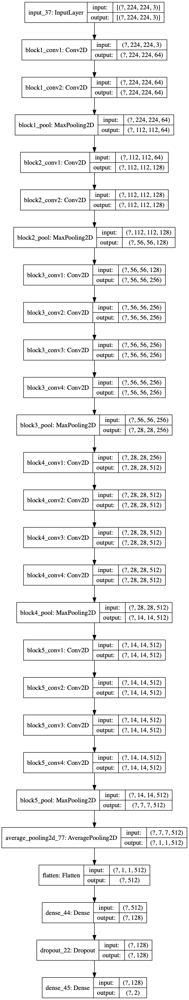

In [77]:
# load the ResNet50V2 network, ensuring the head FC layer sets are left off
baseModel_vgg = VGG19(weights="imagenet", include_top=False,
	input_tensor=Input(shape=(224, 224, 3)))
# construct the head of the model that will be placed on top of the base model
headModel_vgg = baseModel_vgg.output
headModel_vgg = AveragePooling2D(pool_size=(7, 7))(headModel_vgg)
headModel_vgg = Flatten(name="flatten")(headModel_vgg)
headModel_vgg = Dense(128, activation="relu")(headModel_vgg)
headModel_vgg = Dropout(0.5)(headModel_vgg)
headModel_vgg = Dense(2, activation="softmax")(headModel_vgg)
# place the head FC model on top of the base model (this will become the actual model we will train)
model_vgg = Model(inputs=baseModel_vgg.input, outputs=headModel_vgg)
# loop over all layers in the base model and freeze them so they will *not* be updated during the first training process
for layer in baseModel_vgg.layers:
	layer.trainable = False
dot_img_file = '/tmp/model_vgg.png'
plot_model(model_vgg, to_file=dot_img_file, show_shapes=True)

In [17]:
from tensorflow.keras.applications import InceptionV3

In [18]:
# load the ResNet50V2 network, ensuring the head FC layer sets are left off
baseModel_inception = InceptionV3(weights="imagenet", include_top=False,
	input_tensor=Input(shape=(224, 224, 3)))
# construct the head of the model that will be placed on top of the base model
headModel_inception = baseModel_inception.output
headModel_inception = AveragePooling2D(pool_size=(3, 3))(headModel_inception)
headModel_inception = Flatten(name="flatten")(headModel_inception)
headModel_inception = Dense(128, activation="relu")(headModel_inception)
headModel_inception = Dropout(0.5)(headModel_inception)
headModel_inception = Dense(2, activation="softmax")(headModel_inception)
# place the head FC model on top of the base model (this will become the actual model we will train)
model_inception = Model(inputs=baseModel_inception.input, outputs=headModel_inception)
# loop over all layers in the base model and freeze them so they will *not* be updated during the first training process
for layer in baseModel_inception.layers:
	layer.trainable = False
dot_img_file = '/tmp/model_inception.png'
plot_model(model_inception, to_file=dot_img_file, show_shapes=True)

In [11]:
# compile our model
print("[INFO] compiling model MobileNetV2...")
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
model_mobile.compile(loss="binary_crossentropy", optimizer=opt,
	metrics=["accuracy"])
# train the head of the network
print("[INFO] training head MobileNetV2...")
H_mobile = model_mobile.fit(
	aug.flow(trainX, trainY, batch_size=BS),
	steps_per_epoch=len(trainX) // BS,
	validation_data=(testX, testY),
	validation_steps=len(testX) // BS,
	epochs=EPOCHS)

[INFO] compiling model...
[INFO] training head...
Epoch 1/20
30/30 [==============================] - 25s 841ms/step - loss: 0.5094 - accuracy: 0.7729 - val_loss: 0.1541 - val_accuracy: 0.9758
Epoch 2/20
30/30 [==============================] - 25s 828ms/step - loss: 0.1570 - accuracy: 0.9624 - val_loss: 0.0661 - val_accuracy: 0.9927
Epoch 3/20
30/30 [==============================] - 24s 787ms/step - loss: 0.0929 - accuracy: 0.9731 - val_loss: 0.0444 - val_accuracy: 0.9903
Epoch 4/20
30/30 [==============================] - 23s 780ms/step - loss: 0.0645 - accuracy: 0.9807 - val_loss: 0.0335 - val_accuracy: 0.9927
Epoch 5/20
30/30 [==============================] - 23s 759ms/step - loss: 0.0549 - accuracy: 0.9860 - val_loss: 0.0253 - val_accuracy: 0.9952
Epoch 6/20
30/30 [==============================] - 23s 759ms/step - loss: 0.0417 - accuracy: 0.9925 - val_loss: 0.0215 - val_accuracy: 0.9952
Epoch 7/20
30/30 [==============================] - 23s 768ms/step - loss: 0.0544 - accuracy

In [82]:
# compile our model
print("[INFO] compiling model ResNet50V2...")
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
model_resnet.compile(loss="binary_crossentropy", optimizer=opt,
	metrics=["accuracy"])
# train the head of the network
print("[INFO] training head ResNet50V2...")
H_resnet = model_resnet.fit(
	aug.flow(trainX, trainY, batch_size=BS),
	steps_per_epoch=len(trainX) // BS,
	validation_data=(testX, testY),
	validation_steps=len(testX) // BS,
	epochs=EPOCHS)

[INFO] compiling model...
[INFO] training head...
Epoch 1/20
30/30 [==============================] - 58s 2s/step - loss: 0.5224 - accuracy: 0.7510 - val_loss: 0.0691 - val_accuracy: 0.9903
Epoch 2/20
30/30 [==============================] - 58s 2s/step - loss: 0.0984 - accuracy: 0.9721 - val_loss: 0.0358 - val_accuracy: 0.9976
Epoch 3/20
30/30 [==============================] - 56s 2s/step - loss: 0.0581 - accuracy: 0.9860 - val_loss: 0.0260 - val_accuracy: 0.9976
Epoch 4/20
30/30 [==============================] - 56s 2s/step - loss: 0.0519 - accuracy: 0.9839 - val_loss: 0.0212 - val_accuracy: 0.9976
Epoch 5/20
30/30 [==============================] - 56s 2s/step - loss: 0.0412 - accuracy: 0.9882 - val_loss: 0.0188 - val_accuracy: 0.9976
Epoch 6/20
30/30 [==============================] - 57s 2s/step - loss: 0.0249 - accuracy: 0.9903 - val_loss: 0.0164 - val_accuracy: 0.9976
Epoch 7/20
30/30 [==============================] - 57s 2s/step - loss: 0.0218 - accuracy: 0.9957 - val_loss: 

In [19]:
# compile our model
print("[INFO] compiling model InceptionV3...")
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
model_inception.compile(loss="binary_crossentropy", optimizer=opt,
	metrics=["accuracy"])
# train the head of the network
print("[INFO] training head InceptionV3...")
H_inception = model_inception.fit(      
	aug.flow(trainX, trainY, batch_size=BS),
	steps_per_epoch=len(trainX) // BS,
	validation_data=(testX, testY),
	validation_steps=len(testX) // BS,
	epochs=EPOCHS)

[INFO] compiling model InceptionV3...
[INFO] training head InceptionV3...
Epoch 1/20
30/30 [==============================] - 40s 1s/step - loss: 0.5730 - accuracy: 0.7083 - val_loss: 0.2838 - val_accuracy: 0.9274
Epoch 2/20
30/30 [==============================] - 38s 1s/step - loss: 0.3345 - accuracy: 0.8679 - val_loss: 0.1742 - val_accuracy: 0.9588
Epoch 3/20
30/30 [==============================] - 40s 1s/step - loss: 0.2803 - accuracy: 0.8872 - val_loss: 0.1276 - val_accuracy: 0.9661
Epoch 4/20
30/30 [==============================] - 42s 1s/step - loss: 0.2130 - accuracy: 0.9237 - val_loss: 0.1023 - val_accuracy: 0.9855
Epoch 5/20
30/30 [==============================] - 39s 1s/step - loss: 0.1738 - accuracy: 0.9420 - val_loss: 0.0872 - val_accuracy: 0.9806
Epoch 6/20
30/30 [==============================] - 44s 1s/step - loss: 0.1797 - accuracy: 0.9345 - val_loss: 0.0785 - val_accuracy: 0.9927
Epoch 7/20
30/30 [==============================] - 36s 1s/step - loss: 0.1584 - accur

In [85]:
# compile our model
print("[INFO] compiling model VGG19...")
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
model_vgg.compile(loss="binary_crossentropy", optimizer=opt,
	metrics=["accuracy"])
# train the head of the network
print("[INFO] training head VGG19...")
H_vgg = model_vgg.fit(
	aug.flow(trainX, trainY, batch_size=BS),
	steps_per_epoch=len(trainX) // BS,
	validation_data=(testX, testY),
	validation_steps=len(testX) // BS,
	epochs=EPOCHS)

[INFO] compiling model...
[INFO] training head...
Epoch 1/20
30/30 [==============================] - 209s 7s/step - loss: 0.7287 - accuracy: 0.5427 - val_loss: 0.6300 - val_accuracy: 0.7143
Epoch 2/20
30/30 [==============================] - 203s 7s/step - loss: 0.6674 - accuracy: 0.6037 - val_loss: 0.5637 - val_accuracy: 0.8886
Epoch 3/20
30/30 [==============================] - 201s 7s/step - loss: 0.6101 - accuracy: 0.6595 - val_loss: 0.5112 - val_accuracy: 0.9370
Epoch 4/20
30/30 [==============================] - 203s 7s/step - loss: 0.5264 - accuracy: 0.7691 - val_loss: 0.4644 - val_accuracy: 0.9613
Epoch 5/20
30/30 [==============================] - 201s 7s/step - loss: 0.5135 - accuracy: 0.7766 - val_loss: 0.4242 - val_accuracy: 0.9685
Epoch 6/20
30/30 [==============================] - 206s 7s/step - loss: 0.4519 - accuracy: 0.8432 - val_loss: 0.3878 - val_accuracy: 0.9685
Epoch 7/20
30/30 [==============================] - 198s 7s/step - loss: 0.4157 - accuracy: 0.8754 - val

In [14]:
# make predictions on the testing set
print("[INFO] evaluating network MobileNetV2...")
predIdxs = model_mobile.predict(testX, batch_size=BS)
# for each image in the testing set we need to find the index of the
# label with corresponding largest predicted probability
predIdxs = np.argmax(predIdxs, axis=1)
# show a nicely formatted classification report
print(classification_report(testY.argmax(axis=1), predIdxs,
	target_names=lb.classes_))
# serialize the model to disk
print("[INFO] saving mask detector model MobileNetV...")
model_mobile.save("facemask_model_mobile.h5", save_format="h5")

[INFO] evaluating network MobileNetV2...
              precision    recall  f1-score   support

   with_mask       1.00      1.00      1.00       207
without_mask       1.00      1.00      1.00       206

    accuracy                           1.00       413
   macro avg       1.00      1.00      1.00       413
weighted avg       1.00      1.00      1.00       413

[INFO] saving mask detector model MobileNetV...


In [88]:
# make predictions on the testing set
print("[INFO] evaluating network ResNet50V2...")
predIdxs = model_resnet.predict(testX, batch_size=BS)
# for each image in the testing set we need to find the index of the
# label with corresponding largest predicted probability
predIdxs = np.argmax(predIdxs, axis=1)
# show a nicely formatted classification report
print(classification_report(testY.argmax(axis=1), predIdxs,
	target_names=lb.classes_))
# serialize the model to disk
print("[INFO] saving mask detector model ResNet50V2...")
model_resnet.save("facemask_model_resnet.h5", save_format="h5")

[INFO] evaluating network...
              precision    recall  f1-score   support

   with_mask       1.00      1.00      1.00       207
without_mask       1.00      1.00      1.00       206

    accuracy                           1.00       413
   macro avg       1.00      1.00      1.00       413
weighted avg       1.00      1.00      1.00       413

[INFO] saving mask detector model...


In [89]:
# make predictions on the testing set
print("[INFO] evaluating network VGG19...")
predIdxs = model_vgg.predict(testX, batch_size=BS)
# for each image in the testing set we need to find the index of the
# label with corresponding largest predicted probability
predIdxs = np.argmax(predIdxs, axis=1)
# show a nicely formatted classification report
print(classification_report(testY.argmax(axis=1), predIdxs,
	target_names=lb.classes_))
# serialize the model to disk
print("[INFO] saving mask detector model VGG19...")
model_vgg.save("facemask_model_vgg.h5", save_format="h5")

[INFO] evaluating network...
              precision    recall  f1-score   support

   with_mask       0.99      0.99      0.99       207
without_mask       0.99      0.99      0.99       206

    accuracy                           0.99       413
   macro avg       0.99      0.99      0.99       413
weighted avg       0.99      0.99      0.99       413

[INFO] saving mask detector model...


In [20]:
# make predictions on the testing set
print("[INFO] evaluating network InceptionV3...")
predIdxs = model_inception.predict(testX, batch_size=BS)
# for each image in the testing set we need to find the index of the
# label with corresponding largest predicted probability
predIdxs = np.argmax(predIdxs, axis=1)
# show a nicely formatted classification report
print(classification_report(testY.argmax(axis=1), predIdxs,
	target_names=lb.classes_))
# serialize the model to disk
print("[INFO] saving mask detector model InceptionV3...")
model_inception.save("facemask_model_inception.h5", save_format="h5")

[INFO] evaluating network InceptionV3...
              precision    recall  f1-score   support

   with_mask       1.00      1.00      1.00       207
without_mask       1.00      1.00      1.00       206

    accuracy                           1.00       413
   macro avg       1.00      1.00      1.00       413
weighted avg       1.00      1.00      1.00       413

[INFO] saving mask detector model InceptionV3...


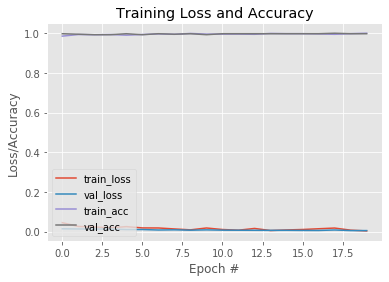

In [91]:
N = EPOCHS
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, N), H_mobile.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), H_mobile.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, N), H_mobile.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, N), H_mobile.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy MobileNetV2")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")
plt.savefig("plot_mobilenet.jpg")

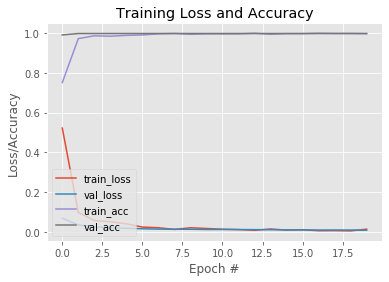

In [92]:
N = EPOCHS
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, N), H_resnet.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), H_resnet.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, N), H_resnet.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, N), H_resnet.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy ResNet50V2")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")
plt.savefig("plot_resnet.jpg")

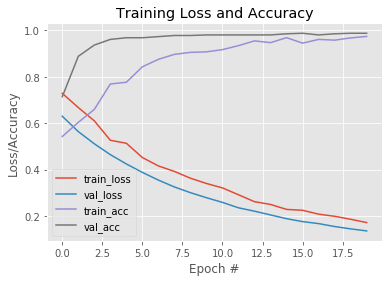

In [93]:
N = EPOCHS
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, N), H_vgg.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), H_vgg.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, N), H_vgg.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, N), H_vgg.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy VGG19")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")
plt.savefig("plot_vgg.jpg")

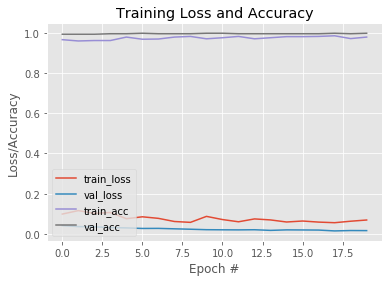

In [94]:
N = EPOCHS
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, N), H_inception.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), H_inception.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, N), H_inception.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, N), H_inception.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy InceptionV3")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")
plt.savefig("plot_inception.jpg")

In [1]:
# import the necessary packages
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.models import load_model
from imutils.video import VideoStream
import numpy as np
import argparse
import imutils
import time
import cv2
import os

In [2]:
def detect_and_predict_mask(frame, faceNet, maskNet):
	# grab the dimensions of the frame and then construct a blob from it
	(h, w) = frame.shape[:2]
	blob = cv2.dnn.blobFromImage(frame, 1.0, (300, 300),
		(104.0, 177.0, 123.0))
	# pass the blob through the network and obtain the face detections
	faceNet.setInput(blob)
	detections = faceNet.forward()
	# initialize our list of faces, their corresponding locations,and the list of predictions from our face mask network
	faces = []
	locs = []
	preds = []
    # loop over the detections
	for i in range(0, detections.shape[2]):
		# extract the confidence (i.e., probability) associated withthe detection
		confidence = detections[0, 0, i, 2]
		# filter out weak detections by ensuring the confidence is greater than the minimum confidence
		if confidence > 0.5:
			# compute the (x, y)-coordinates of the bounding box for the object
			box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
			(startX, startY, endX, endY) = box.astype("int")
			# ensure the bounding boxes fall within the dimensions of the frame
			(startX, startY) = (max(0, startX), max(0, startY))
			(endX, endY) = (min(w - 1, endX), min(h - 1, endY))
            # extract the face ROI, convert it from BGR to RGB channel ordering, resize it to 224x224, and preprocess it
			face = frame[startY:endY, startX:endX]
			face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
			face = cv2.resize(face, (224, 224))
			face = img_to_array(face)
			face = preprocess_input(face)
			face = np.expand_dims(face, axis=0)
			# add the face and bounding boxes to their respective lists
			faces.append(face)
			locs.append((startX, startY, endX, endY))
            # only make a predictions if at least one face was detected
	if len(faces) > 0:
		# for faster inference we'll make batch predictions on *all*
        #faces at the same time rather than one-by-one predictions in the above `for` loop
		preds = maskNet.predict(faces)
	# return a 2-tuple of the face locations and their corresponding locations
	return (locs, preds)

In [3]:
# load our serialized face detector model from disk
print("[INFO] loading face detector model...")
prototxtPath = os.path.sep.join(["./face_detector/", "deploy.prototxt"])
weightsPath = os.path.sep.join(["./face_detector/",
	"res10_300x300_ssd_iter_140000.caffemodel"])
faceNet = cv2.dnn.readNet(prototxtPath, weightsPath)
# load the face mask detector model from disk
print("[INFO] loading face mask detector model...")
maskNet_mobile = load_model("./facemask_model_mobile.h5")
maskNet_resnet = load_model("./facemask_model_resnet.h5")
maskNet_inception = load_model("./facemask_model_inception.h5")
maskNet_vgg = load_model("./facemask_model_vgg.h5")
# initialize the video stream and allow the camera sensor to warm up
print("[INFO] starting video stream...")
vs = VideoStream(src=0).start()
time.sleep(2.0)

[INFO] loading face detector model...
[INFO] loading face mask detector model...
[INFO] starting video stream...


Running Video Stream on using Face Mask Model Built over MobileNetV2

In [ ]:
while True:
	# grab the frame from the threaded video stream and resize it
	# to have a maximum width of 400 pixels
	frame = vs.read()
	frame = imutils.resize(frame, width=400)
	# detect faces in the frame and determine if they are wearing a
	# face mask or not
	(locs, preds) = detect_and_predict_mask(frame, faceNet, maskNet)
    # loop over the detected face locations and their corresponding
	# locations
	for (box, pred) in zip(locs, preds):
		# unpack the bounding box and predictions
		(startX, startY, endX, endY) = box
		(mask, withoutMask) = pred
		# determine the class label and color we'll use to draw
		# the bounding box and text
		label = "Mask" if mask > withoutMask else "No Mask"
		color = (0, 255, 0) if label == "Mask" else (0, 0, 255)
		# include the probability in the label
		label = "{}: {:.2f}%".format(label, max(mask, withoutMask) * 100)
		# display the label and bounding box rectangle on the output
		# frame
		cv2.putText(frame, label, (startX, startY - 10),
			cv2.FONT_HERSHEY_SIMPLEX, 0.45, color, 2)
		cv2.rectangle(frame, (startX, startY), (endX, endY), color, 2)
        # show the output frame
	cv2.imshow("Frame", frame)
	key = cv2.waitKey(1) & 0xFF
	# if the `q` key was pressed, break from the loop
	if key == ord("q"):
		break
# do a bit of cleanup
cv2.destroyAllWindows()
vs.stop()

Running Video Stream on using Face Mask Model Built over ResNet50V2

In [4]:
while True:
	# grab the frame from the threaded video stream and resize it
	# to have a maximum width of 400 pixels
	frame = vs.read()
	frame = imutils.resize(frame, width=400)
	# detect faces in the frame and determine if they are wearing a
	# face mask or not
	(locs, preds) = detect_and_predict_mask(frame, faceNet, maskNet_resnet)
    # loop over the detected face locations and their corresponding
	# locations
	for (box, pred) in zip(locs, preds):
		# unpack the bounding box and predictions
		(startX, startY, endX, endY) = box
		(mask, withoutMask) = pred
		# determine the class label and color we'll use to draw
		# the bounding box and text
		label = "Mask" if mask > withoutMask else "No Mask"
		color = (0, 255, 0) if label == "Mask" else (0, 0, 255)
		# include the probability in the label
		label = "{}: {:.2f}%".format(label, max(mask, withoutMask) * 100)
		# display the label and bounding box rectangle on the output
		# frame
		cv2.putText(frame, label, (startX, startY - 10),
			cv2.FONT_HERSHEY_SIMPLEX, 0.45, color, 2)
		cv2.rectangle(frame, (startX, startY), (endX, endY), color, 2)
        # show the output frame
	cv2.imshow("Frame", frame)
	key = cv2.waitKey(1) & 0xFF
	# if the `q` key was pressed, break from the loop
	if key == ord("q"):
		break
# do a bit of cleanup
cv2.destroyAllWindows()
vs.stop()

Running Video Stream on using Face Mask Model Built over InceptionV3

In [13]:
while True:
	# grab the frame from the threaded video stream and resize it
	# to have a maximum width of 400 pixels
	frame = vs.read()
	frame = imutils.resize(frame, width=400)
	# detect faaces in the frame and determine if they are wearing a
	# face mask or not
	(locs, preds) = detect_and_predict_mask(frame, faceNet, maskNet_inception)
    # loop over the detected face locations and their corresponding
	# locations
	for (box, pred) in zip(locs, preds):
		# unpack the bounding box and predictions
		(startX, startY, endX, endY) = box
		(mask, withoutMask) = pred
		# determine the class label and color we'll use to draw
		# the bounding box and text
		label = "Mask" if mask > withoutMask else "No Mask"
		color = (0, 255, 0) if label == "Mask" else (0, 0, 255)
		# include the probability in the label
		label = "{}: {:.2f}%".format(label, max(mask, withoutMask) * 100)
		# display the label and bounding box rectangle on the output
		# frame
		cv2.putText(frame, label, (startX, startY - 10),
			cv2.FONT_HERSHEY_SIMPLEX, 0.45, color, 2)
		cv2.rectangle(frame, (startX, startY), (endX, endY), color, 2)
        # show the output frame
	cv2.imshow("Frame", frame)
	key = cv2.waitKey(1) & 0xFF
	# if the `q` key was pressed, break from the loop
	if key == ord("q"):
		break
# do a bit of cleanup
cv2.destroyAllWindows()
vs.stop()

NameError: name 'vs' is not defined

Running Video Stream on using Face Mask Model Built over VGG19

In [ ]:
while True:
	# grab the frame from the threaded video stream and resize it
	# to have a maximum width of 400 pixels
	frame = vs.read()
	frame = imutils.resize(frame, width=400)
	# detect faces in the frame and determine if they are wearing a
	# face mask or not
	(locs, preds) = detect_and_predict_mask(frame, faceNet, maskNet_vgg)
    # loop over the detected face locations and their corresponding
	# locations
	for (box, pred) in zip(locs, preds):
		# unpack the bounding box and predictions
		(startX, startY, endX, endY) = box
		(mask, withoutMask) = pred
		# determine the class label and color we'll use to draw
		# the bounding box and text
		label = "Mask" if mask > withoutMask else "No Mask"
		color = (0, 255, 0) if label == "Mask" else (0, 0, 255)
		# include the probability in the label
		label = "{}: {:.2f}%".format(label, max(mask, withoutMask) * 100)
		# display the label and bounding box rectangle on the output
		# frame
		cv2.putText(frame, label, (startX, startY - 10),
			cv2.FONT_HERSHEY_SIMPLEX, 0.45, color, 2)
		cv2.rectangle(frame, (startX, startY), (endX, endY), color, 2)
        # show the output frame
	cv2.imshow("Frame", frame)
	key = cv2.waitKey(1) & 0xFF
	# if the `q` key was pressed, break from the loop
	if key == ord("q"):
		break
# do a bit of cleanup
cv2.destroyAllWindows()
vs.stop()

Thanks for reading this! :)